In [ ]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
import seaborn as sns



import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All"
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

### Data

First, I would just load a few images to see what we're working with.

In [ ]:
from tensorflow.keras.preprocessing.image import load_img, ImageDataGenerator
from PIL import Image
import cv2

### Dataset Preview

#### NORMAL

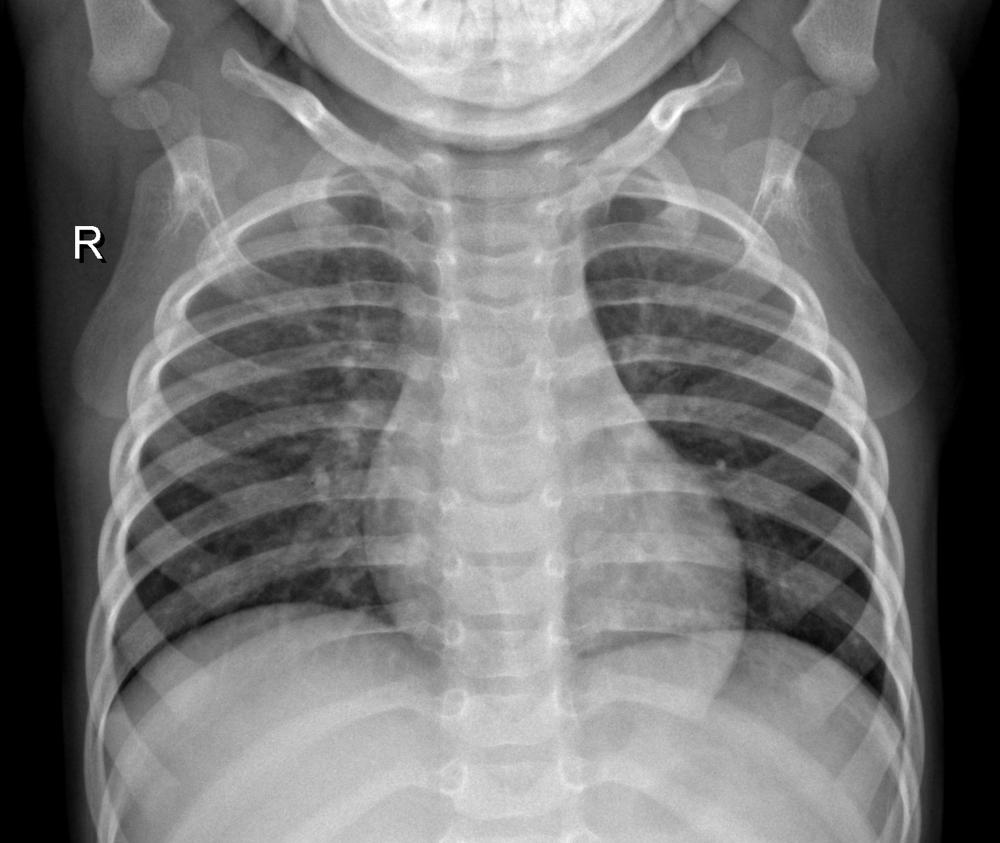

In [ ]:
load_img('/content/drive/MyDrive/chest_xray/train/NORMAL/IM-0129-0001.jpeg')

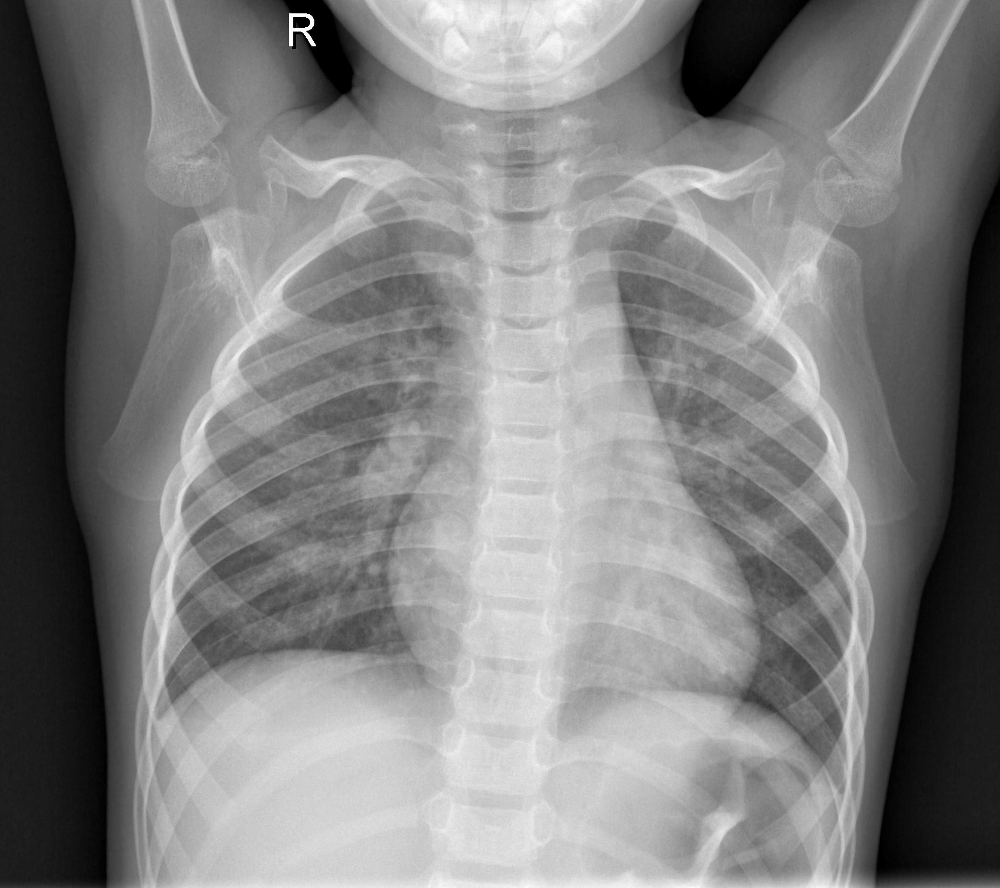

In [ ]:
load_img('/content/drive/MyDrive/chest_xray/train/NORMAL/IM-0115-0001.jpeg')

#### PNEUMONIA

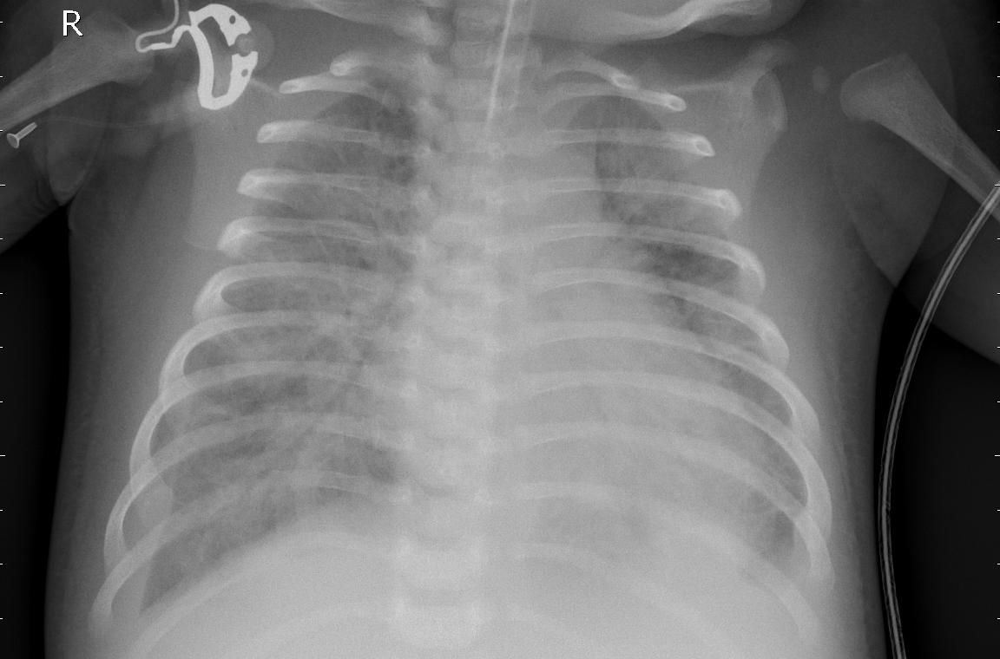

In [ ]:
load_img('/content/drive/MyDrive/chest_xray/train/PNEUMONIA/person1000_bacteria_2931.jpeg')

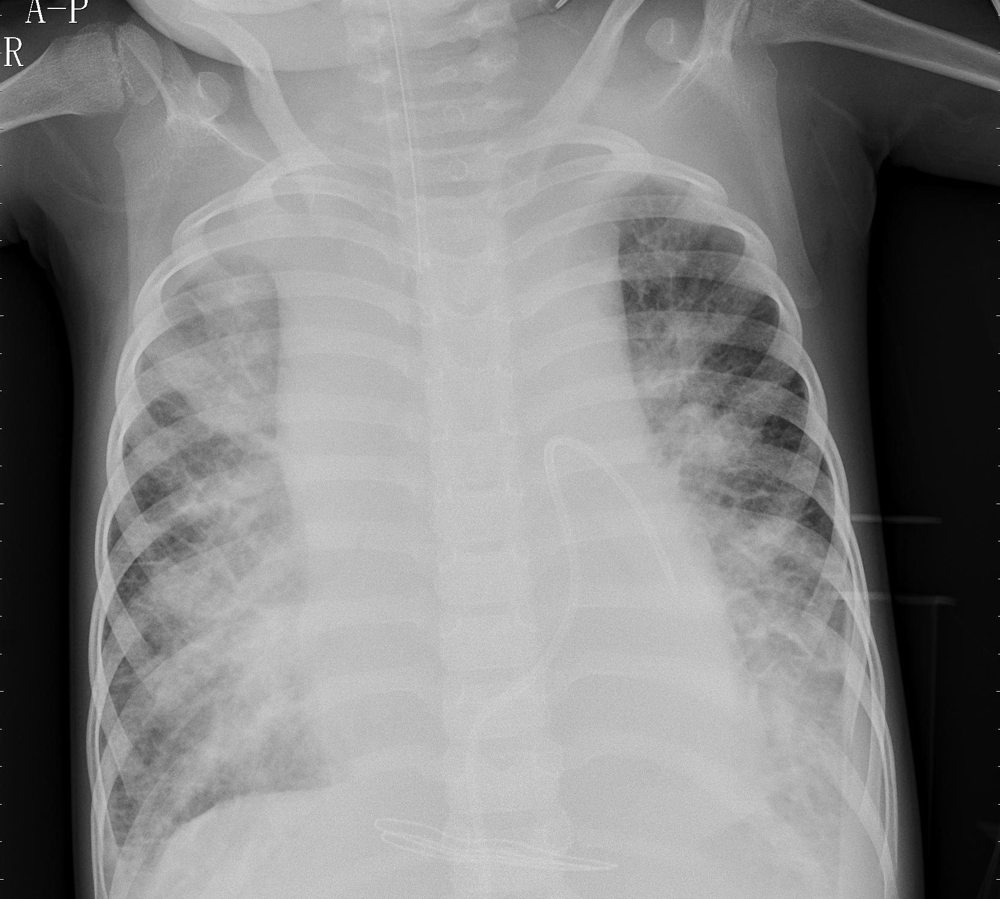

In [ ]:
load_img('/content/drive/MyDrive/chest_xray/train/PNEUMONIA/person1015_virus_1701.jpeg')

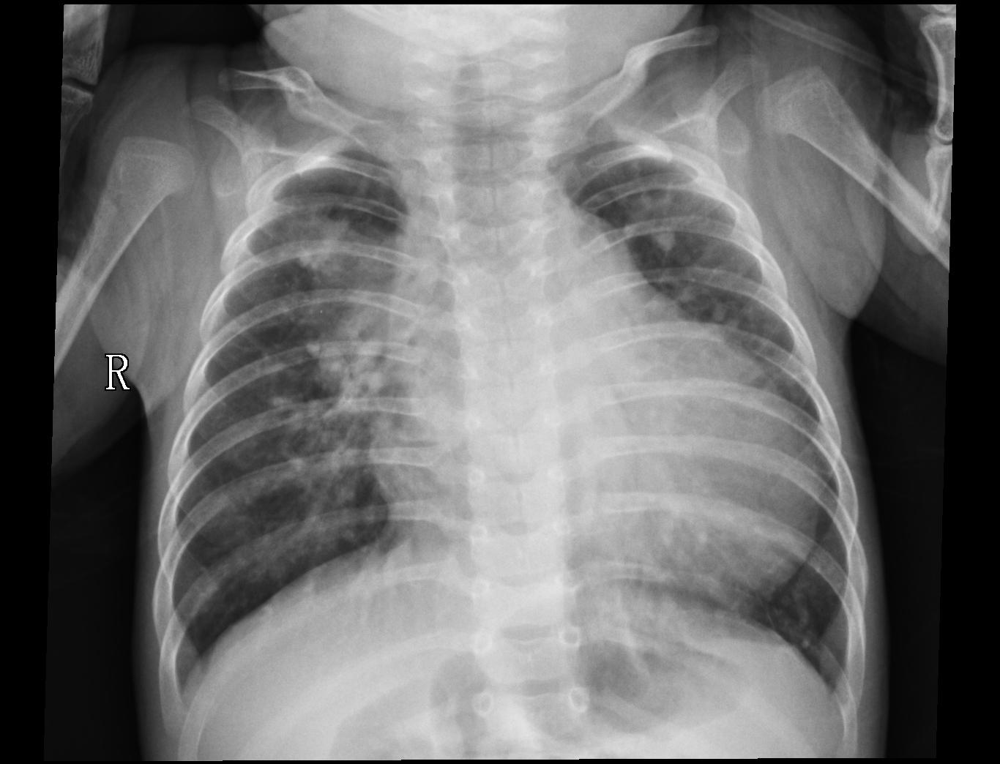

In [ ]:
load_img('/content/drive/MyDrive/chest_xray/train/PNEUMONIA/person1014_bacteria_2945.jpeg')

It looks like Pneumonia X-rays have a "cloudy" look with high opacity in the lungs area. The contrast between the bones and the lungs area seems to be higher in 'NORMAL' category X-rays, and you can almost see the lung vessels clearly.

However, to be honest, some of the images in these 2 groups look quite similar, and it's not really easy for the untrained eyes to differentiate.

Next, I'll look at the dimensions of these images.

In [ ]:
Image.open('/content/drive/MyDrive/chest_xray/train/PNEUMONIA/person1014_bacteria_2945.jpeg').size

(1366, 1044)

In [ ]:
Image.open('/content/drive/MyDrive/chest_xray/train/PNEUMONIA/person1015_virus_1701.jpeg').size

(1664, 1496)

In [ ]:
Image.open('/content/drive/MyDrive/chest_xray/train/NORMAL/IM-0128-0001.jpeg').size

(1528, 1013)

In [ ]:
Image.open('/content/drive/MyDrive/chest_xray/train/NORMAL/IM-0172-0001.jpeg').size

(1876, 1893)

It seems like the images are relatively large, with each dimension being roughly 1000-1800 pixels. They don't have uniform size, therefore, we'll need to rescale them later.

### Checking number of channels for each image

In [ ]:
img = cv2.imread('/content/drive/MyDrive/chest_xray/train/NORMAL/IM-0172-0001.jpeg')

In [ ]:
print(img.shape)

(1893, 1876, 3)


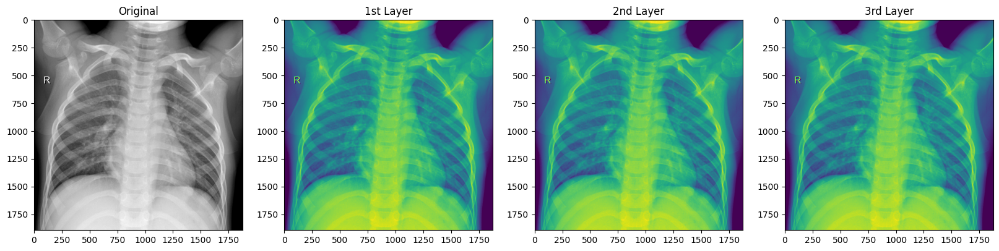

In [ ]:
# DISPLAYING THE FIRST LAYER
fig, (ax1,ax2,ax3,ax4) = plt.subplots(nrows=1, ncols=4, figsize=(20,5))
ax1.imshow(img)
ax1.set_title('Original')

ax2.imshow(img[:, :, 0])
ax2.set_title('1st Layer')

ax3.imshow(img[:, :, 1])
ax3.set_title('2nd Layer')

ax4.imshow(img[:, :, 2])
ax4.set_title('3rd Layer');

These 3 layers look very similar to each other. Therefore I decided to compare the values of the pixels in each layer.

In [ ]:
print((img[:, :, 0] == img[:, :, 1]).all())
print((img[:, :, 0] == img[:, :, 2]).all())

True
True


In [ ]:
import os
import glob
from pathlib import Path

In [ ]:
# GET THE DIRECTORY TO THE DATASETS
path_data = '/content/drive/MyDrive/chest_xray'
path_train = os.path.join(path_data, 'train')
path_val = os.path.join(path_data, 'val')
path_test = os.path.join(path_data, 'test')

# INITIATE EMPTY LIST OF TRAINING DATA
# THAT WILL BE CONVERTED TO PANDAS DATAFRAME LATER
data_train = []
data_val = []
data_test = []
data = [data_train, data_val, data_test]

# ITERATE THROUGH EACH PATH
for i, d in enumerate([path_train, path_val, path_test]):
    # GET THE PATH TO EACH FOLDER - NORMAL AND PNEUMONIA
    normal = os.path.join(d, 'NORMAL')
    pneumonia = os.path.join(d, 'PNEUMONIA')

    # FETCH ALL .jpeg FILES
    normal_imgs = Path(normal).glob('*.jpeg')
    pneumonia_imgs = Path(pneumonia).glob('*.jpeg')

    # APPEND THE NAME AND CORRESPONDING LABEL (BASED ON FOLDER NAME)
    # TO data_train list AS TUPLES
    for img in normal_imgs:
        data[i].append((str(img), 0))

    for img in pneumonia_imgs:
        data[i].append((str(img), 1))

In [ ]:
# CONVERT data_train TO DATAFRAME FOR EASY MANIPULATION
columns = ['image', 'label']
train_df = pd.DataFrame(data_train, columns=columns)
val_df = pd.DataFrame(data_val, columns=columns)
test_df = pd.DataFrame(data_test, columns=columns)

In [ ]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5216 entries, 0 to 5215
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   image   5216 non-null   object
 1   label   5216 non-null   int64 
dtypes: int64(1), object(1)
memory usage: 81.6+ KB


In [ ]:
train_df.label.value_counts()

,count
label,
1,3875
0,1341


In [ ]:
val_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16 entries, 0 to 15
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   image   16 non-null     object
 1   label   16 non-null     int64 
dtypes: int64(1), object(1)
memory usage: 384.0+ bytes


In [ ]:
val_df.label.value_counts()

,count
label,
0,8
1,8


In [ ]:
test_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 624 entries, 0 to 623
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   image   624 non-null    object
 1   label   624 non-null    int64 
dtypes: int64(1), object(1)
memory usage: 9.9+ KB


In [ ]:
# CONCAT train_df and val_df
master_df = pd.concat([train_df, val_df])
# RESET INDEX (SO THERE WON'T BE ANY DUPLICATED INDICES) BY DROPPING OLD ONES
master_df.reset_index(inplace=True, drop=True)

In [ ]:
master_df.tail(20)

,image,label
5212,/content/drive/MyDrive/chest_xray/train/PNEUMO...,1
5213,/content/drive/MyDrive/chest_xray/train/PNEUMO...,1
5214,/content/drive/MyDrive/chest_xray/train/PNEUMO...,1
5215,/content/drive/MyDrive/chest_xray/train/PNEUMO...,1
5216,/content/drive/MyDrive/chest_xray/val/NORMAL/N...,0
5217,/content/drive/MyDrive/chest_xray/val/NORMAL/N...,0
5218,/content/drive/MyDrive/chest_xray/val/NORMAL/N...,0
5219,/content/drive/MyDrive/chest_xray/val/NORMAL/N...,0
5220,/content/drive/MyDrive/chest_xray/val/NORMAL/N...,0
5221,/content/drive/MyDrive/chest_xray/val/NORMAL/N...,0


In [ ]:
master_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5232 entries, 0 to 5231
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   image   5232 non-null   object
 1   label   5232 non-null   int64 
dtypes: int64(1), object(1)
memory usage: 81.9+ KB


In [ ]:
# CHECK FOR DUPLICATES
master_df.duplicated().any()

False

In [ ]:
master_df.sample(10, random_state=42)

,image,label
240,/content/drive/MyDrive/chest_xray/train/NORMAL...,0
584,/content/drive/MyDrive/chest_xray/train/NORMAL...,0
2259,/content/drive/MyDrive/chest_xray/train/PNEUMO...,1
1420,/content/drive/MyDrive/chest_xray/train/PNEUMO...,1
1835,/content/drive/MyDrive/chest_xray/train/PNEUMO...,1
80,/content/drive/MyDrive/chest_xray/train/NORMAL...,0
3859,/content/drive/MyDrive/chest_xray/train/PNEUMO...,1
952,/content/drive/MyDrive/chest_xray/train/NORMAL...,0
4431,/content/drive/MyDrive/chest_xray/train/PNEUMO...,1
1260,/content/drive/MyDrive/chest_xray/train/NORMAL...,0


In [ ]:
master_df.label.value_counts()

,count
label,
1,3883
0,1349


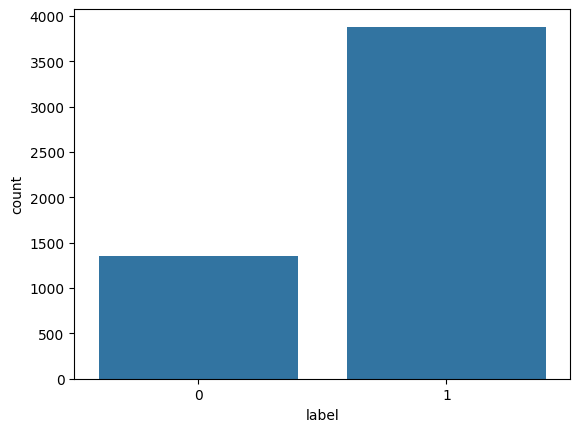

In [ ]:
sns.countplot(x='label', data=master_df);

In [ ]:
from sklearn.model_selection import train_test_split

In [ ]:
# TRAIN VALIDATION SPLIT
train_df, val_df = train_test_split(master_df, test_size=0.2, random_state=42)

In [ ]:

len(set(val_df.index) - set(train_df.index)) == len(val_df)

True

### Data Generators

In [ ]:
BATCH_SIZE = 32

# CREATE GENERATOR FOR TRAINING DATA (FROM train_df DATAFRAME)
train_generator = ImageDataGenerator(rescale=1.0/255).flow_from_dataframe(
    dataframe=train_df, x_col='image', y_col='label',
    color_mode='grayscale',
    class_mode='raw',
    target_size=(180,180),
    batch_size=BATCH_SIZE,
    seed=42,
    shuffle=True   # shuffle so we're not missing out on any samples
)

# CREATE GENERATOR FOR VALIDATION DATA (FROM val_df DATAFRAME)
val_generator = ImageDataGenerator(rescale=1.0/255).flow_from_dataframe(
    dataframe=val_df, x_col='image', y_col='label',
    color_mode='grayscale',
    class_mode='raw',
    target_size=(180,180),
    batch_size=BATCH_SIZE,
    seed=42,
    shuffle=True
)

Found 4185 validated image filenames.
Found 1047 validated image filenames.


In [ ]:
# CHECKING THE SHAPE OF 1 BATCH OF THE train_generator
images_train, labels_train = next(train_generator)
print(f'Training set: {images_train.shape} | {labels_train.shape}')

Training set: (32, 180, 180, 1) | (32,)


### Dataset Visualization
Next, I am going to display the first 16 images of the first batch with their corresponding labels:
- 0 - NORMAL
- 1 - PNEUMONIA

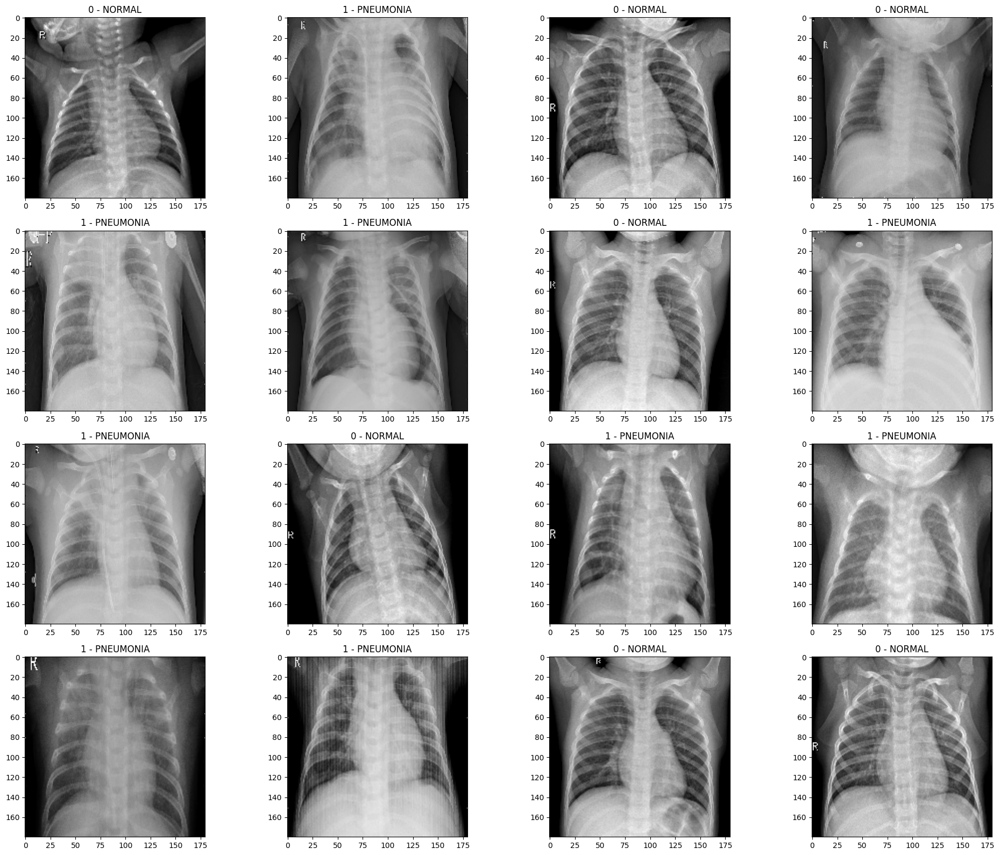

In [ ]:
fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(20,16))
label_output = {0: 'NORMAL', 1: 'PNEUMONIA'}
i = range(16)

for i in range(16):
    ax = axes[i // 4][i % 4]
    ax.imshow(images_train[i], cmap='gray')
    ax.set_title(f'{labels_train[i]} - {label_output[labels_train[i]]}')

plt.tight_layout()
plt.show();

# Modeling

In [ ]:
from keras.models import Sequential, load_model
from keras.layers import Dense, Conv2D, Flatten, MaxPooling2D, Dropout
from keras.metrics import Recall, Precision
from sklearn.metrics import confusion_matrix
from keras.callbacks import ModelCheckpoint, EarlyStopping
from keras.optimizers.schedules import ExponentialDecay
from sklearn.metrics import ConfusionMatrixDisplay # Import the replacement class


In [ ]:
baseline = Sequential()
baseline.add(Conv2D(32, (3,3), activation='relu', padding='same',
               input_shape=[180,180,1]))
baseline.add(MaxPooling2D(pool_size=(2,2)))
baseline.add(Flatten())
baseline.add(Dense(32, activation='relu'))
baseline.add(Dense(1, activation='sigmoid'))

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [ ]:
recall = Recall()
precision = Precision()

In [ ]:
baseline.compile(loss='binary_crossentropy',
                 optimizer='adam',
                 metrics=['accuracy', recall, precision])

In [ ]:
baseline.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 180, 180, 32)        │             320 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 90, 90, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 259200)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 32)                  │       8,294,432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │              33 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,294,785 (31.64 MB)

 Trainable params: 8,294,785 (31.64 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
checkpoint_cb = ModelCheckpoint('baseline.keras', # file extension to .keras
                                save_best_only=True)
early_stopping_cb = EarlyStopping(patience=10,
                                  restore_best_weights=True)

BATCH_SIZE = 64
EPOCHS = 3

results_1 = baseline.fit(train_generator,
                         validation_data=val_generator,
                         epochs=EPOCHS,
                         steps_per_epoch=(train_generator.n//BATCH_SIZE),
                         validation_steps=(val_generator.n//BATCH_SIZE),
                         callbacks=[checkpoint_cb, early_stopping_cb])

Epoch 1/3


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


65/65 ━━━━━━━━━━━━━━━━━━━━ 228s 3s/step - accuracy: 0.7703 - loss: 1.2366 - precision: 0.7692 - recall: 0.9957 - val_accuracy: 0.8223 - val_loss: 0.3472 - val_precision: 0.8082 - val_recall: 0.9947
Epoch 2/3
65/65 ━━━━━━━━━━━━━━━━━━━━ 121s 2s/step - accuracy: 0.8742 - loss: 0.3195 - precision: 0.8634 - recall: 0.9863 - val_accuracy: 0.9238 - val_loss: 0.2857 - val_precision: 0.9152 - val_recall: 0.9866
Epoch 3/3
 1/65 ━━━━━━━━━━━━━━━━━━━━ 1:19 1s/step - accuracy: 0.9062 - loss: 0.2772 - precision: 0.8929 - recall: 1.0000

/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


65/65 ━━━━━━━━━━━━━━━━━━━━ 2s 19ms/step - accuracy: 0.9062 - loss: 0.2772 - precision: 0.8929 - recall: 1.0000 - val_accuracy: 0.9130 - val_loss: 0.2614 - val_precision: 0.8889 - val_recall: 1.0000


In [ ]:
# VISUALIZE MODEL PERFORMANCE
def visualize_training_results(results):
    history = results.history

    for m in ['loss', 'accuracy', 'precision', 'recall']:
        plt.figure(figsize=(15,5))
        plt.plot(history[m], label='Training', marker='o', color='blue')
        plt.plot(history[f'val_{m}'], label='Validation', marker='o', color='red')
        plt.xlabel('Epochs')
        plt.legend()
        plt.title(m.title())

    plt.show();

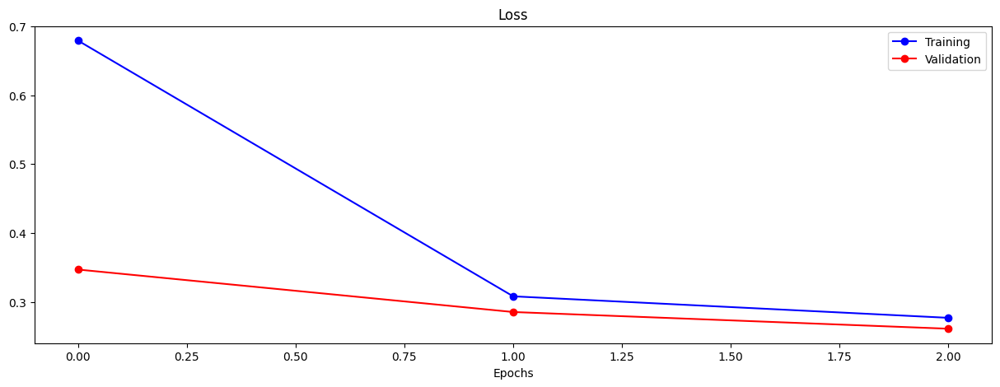

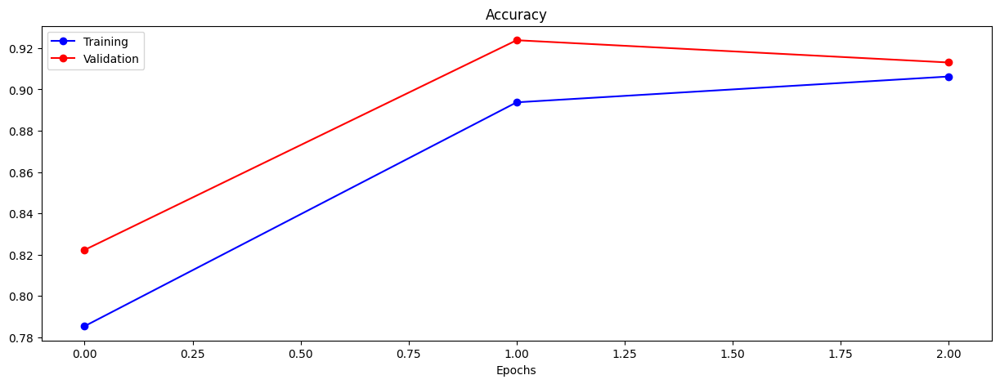

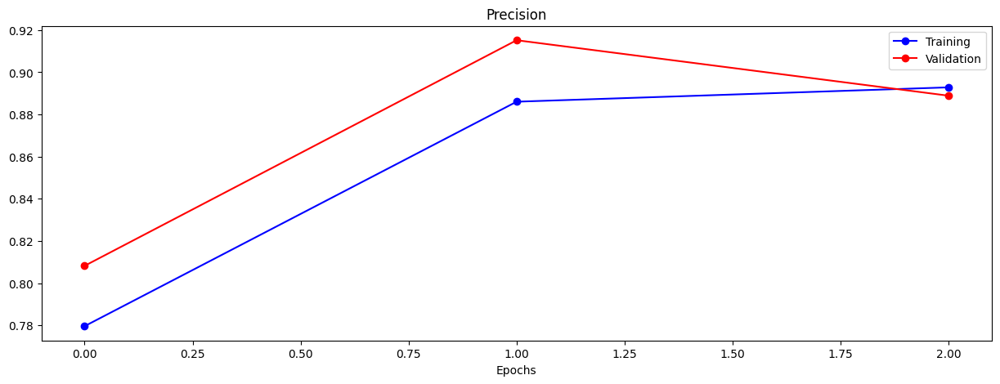

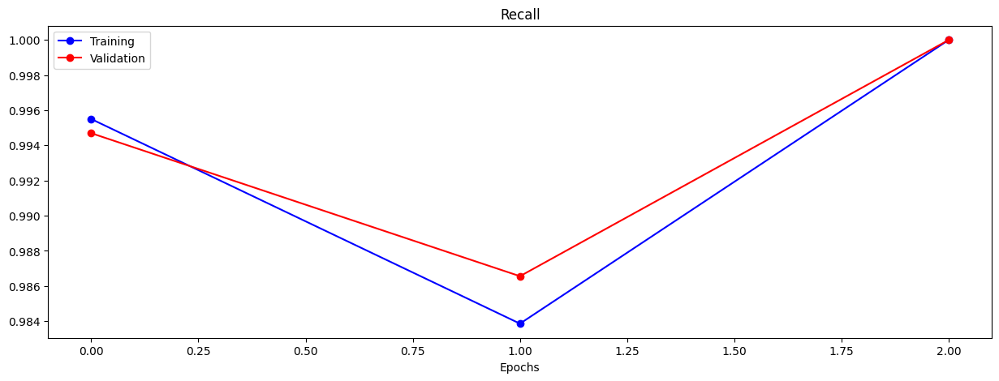

In [ ]:
visualize_training_results(results_1)

In [ ]:
# GENERATE PREDICTIONS ON TRAINING & VALIDATION DATA

# RECREATE GENERATORS FOR TRAINING & VALIDATION SET WITH shuffle = False
# IN ORDER TO PRESERVE THE ORDER OF THE IMAGES AND THEIR LABELS

train_eval_generator = ImageDataGenerator(rescale=1.0/255).flow_from_dataframe(
    dataframe=train_df, x_col='image', y_col='label',
    class_mode='raw',
    color_mode='grayscale',
    target_size=(180,180), batch_size=BATCH_SIZE,
    seed=2021,
    shuffle=False     # not shuffle so that the predicts come out in the same order as in the original dataset
)

val_eval_generator = ImageDataGenerator(rescale=1.0/255).flow_from_dataframe(
    dataframe=val_df, x_col='image', y_col='label',
    class_mode='raw',
    color_mode='grayscale',
    target_size=(180,180), batch_size=BATCH_SIZE,
    seed=2021,
    shuffle=False
)

# MAKE PREDICTIONS USING THE EVALUATION GENERATORS
preds_train_1 = baseline.predict(train_eval_generator,
                                   steps=(train_generator.n//BATCH_SIZE+1),
                                   verbose=1
                                   ) # remove workers argument
preds_val_1 = baseline.predict(val_eval_generator,
                                 steps=(val_generator.n//BATCH_SIZE+1),
                                 verbose=1
                                 ) # remove workers argument

Found 4185 validated image filenames.
Found 1047 validated image filenames.


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


66/66 ━━━━━━━━━━━━━━━━━━━━ 100s 2s/step
17/17 ━━━━━━━━━━━━━━━━━━━━ 20s 1s/step


In [ ]:
baseline_metrics = baseline.evaluate(val_eval_generator)
baseline_metrics

17/17 ━━━━━━━━━━━━━━━━━━━━ 20s 1s/step - accuracy: 0.9287 - loss: 0.2794 - precision: 0.9207 - recall: 0.9867


[0.2818816006183624,
 0.9283667802810669,
 0.9894319772720337,
 0.9178921580314636]

In [ ]:
# CREATE A DATAFRAME TO KEEP TRACK OF ALL MODELS PERFOMANCE ON VALIDATION SET
perf_df = pd.DataFrame(columns=['model', 'loss', 'accuracy', 'recall', 'precision'])

In [ ]:
# APPEND BASELINE NUMBERS TO DATAFRAME
perf_df.loc[len(perf_df.index)] = ['baseline'] + baseline_metrics

In [ ]:
perf_df

,model,loss,accuracy,recall,precision
0,baseline,0.281882,0.928367,0.989432,0.917892


In [ ]:
def plot_confusionmatrix(y_true, y_pred):
    cm = confusion_matrix(y_true, y_pred)

    ax= plt.subplot()
    # annot=True to annotate cells, ftm='g' to disable scientific notation
    sns.heatmap(cm, annot=True, fmt='g', ax=ax)

    # labels, title and ticks
    ax.set_xlabel('Predicted labels')
    ax.set_ylabel('True labels')
    ax.set_title('Confusion Matrix')
    ax.xaxis.set_ticklabels(['NORMAL', 'PNEUMONIA'])
    ax.yaxis.set_ticklabels(['NORMAL', 'PNEUMONIA'])
    plt.show();

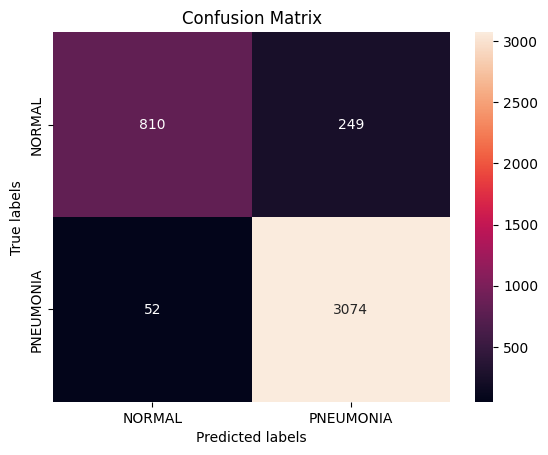

In [ ]:
# PLOT CONFUSION MATRIX FOR TRAINING SET
# (converting predicted values from float to nearest integer)
plot_confusionmatrix(train_df['label'], np.rint(preds_train_1))

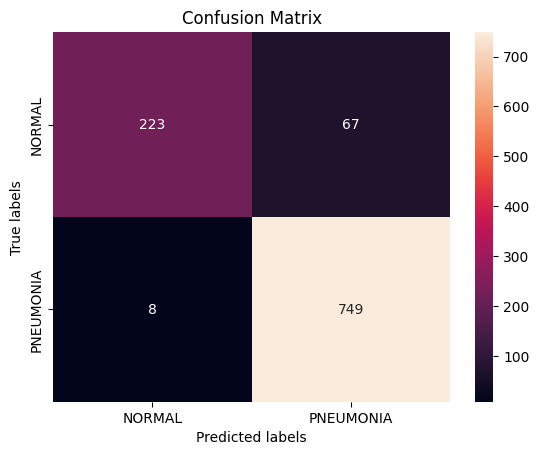

In [ ]:
# PLOT CONFUSION MATRIX FOR VALIDATION SET
plot_confusionmatrix(val_df['label'], np.rint(preds_val_1))

In [ ]:
val_df.label.value_counts()

,count
label,
1,757
0,290


In [ ]:
749/757

0.9894319682959049

Overall the model perform relatively well on unseen data (validation set). Out of 757 Pneumonia cases, it accurately identified 749, and gave us a Recall score of 98.89%, which is very high.

Since Accuracy for a highly imbalanced dataset could be skewed, models with higher Recall score would be prioritized in this business case.

In [ ]:
# SAVE THE MODEL
baseline.save("baseline.keras")